In [266]:
!pip install -q pandas numpy openpyxl statsmodels matplotlib seaborn


[notice] A new release of pip available: 22.3 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [47]:
import os

os.makedirs("dataset", exist_ok=True)

In [48]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np



pd.set_option('display.float_format', lambda x: '%.4f' % x)

plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False
plt.rcParams['axes.titlepad'] = 20

# ind_code_s에서 7분
# ind_code_d에서 74분
ind_code_class = "ind_code_s"

In [49]:
df = pd.read_csv("dataset/working_capital_dataset.csv", encoding="utf-8").sort_values(["date", "firmcode"])

In [50]:
condition = (~df["delta_cashflow"].isna()) & (~df["firm_type"].isna())

# Ind Shock

In [51]:
import statsmodels.api as sm

def calculate_firm_beta(data, firm_col, independent_col, dependent_col):
    firm_betas = []
    for firm, group in data.groupby(firm_col):
        group = group.dropna(subset=[independent_col, dependent_col])
        
        if len(group) > 1:
            X = group[independent_col]
            y = group[dependent_col]
            X = sm.add_constant(X)
            model = sm.OLS(y, X).fit()
            beta = model.params.iloc[1]
        else:
            beta = None 
            
        firm_betas.append({"firmcode": firm, "beta": beta})
    
    result_df = pd.DataFrame(firm_betas)
    return result_df

In [52]:
pd.set_option('display.float_format', lambda x: '%.12f' % x)

result = calculate_firm_beta(
    df[condition], 
    firm_col="firmcode", 
    independent_col="oil_price_growth", 
    dependent_col="delta_cashflow"
)

print(result.shape, df.shape)
print(result["beta"].value_counts(dropna=False).value_counts())
result["beta"].value_counts(dropna=False)

(2031, 2) (296406, 83)
count
1     1969
62       1
Name: count, dtype: int64


beta
NaN                62
-0.000083798052     1
0.000097982136      1
-0.000164041806     1
0.000863916360      1
                   ..
0.000062490803      1
0.000040609679      1
0.000053982438      1
0.000116808981      1
-0.001331665712     1
Name: count, Length: 1970, dtype: int64

In [53]:
for v in ["beta", "beta_firm", "beta_ind"]:
    if v in df.columns:
        del df[v]

df = pd.merge(df, result, on="firmcode", how="left")
df = pd.merge(df, df.groupby(ind_code_class)["beta"].mean(), 
    on=ind_code_class, how="left", suffixes=("_firm", "_ind"), validate="m:1")
df["ind_shock"] = df["oil_price_growth"] * df["beta_ind"]
df[[
    "firmcode", "oil_price_growth", "beta_firm", "beta_ind", "ind_shock"
]]

,firmcode,oil_price_growth,beta_firm,beta_ind,ind_shock
0,A000020,NaN,-0.000083798052,0.000017880171,NaN
1,A000040,NaN,0.000119123430,-0.000399025979,NaN
2,A000050,NaN,-0.000022914793,-0.000006734050,NaN
3,A000070,NaN,-0.000015973232,-0.000021676397,NaN
4,A000080,NaN,0.000013573219,0.000025345268,NaN
...,...,...,...,...,...
296401,A950180,-3.478305600000,NaN,0.000101260594,-0.000352215290
296402,A950190,-3.478305600000,NaN,0.000101260594,-0.000352215290
296403,A950200,-3.478305600000,NaN,0.000038289790,-0.000133183593
296404,A950210,-3.478305600000,NaN,-0.000323237989,0.001124320506


In [54]:
df["beta_ind"].isna().sum()

5148

##### Plot


<Axes: title={'center': 'Industry Beta Distribution'}, ylabel='Density'>

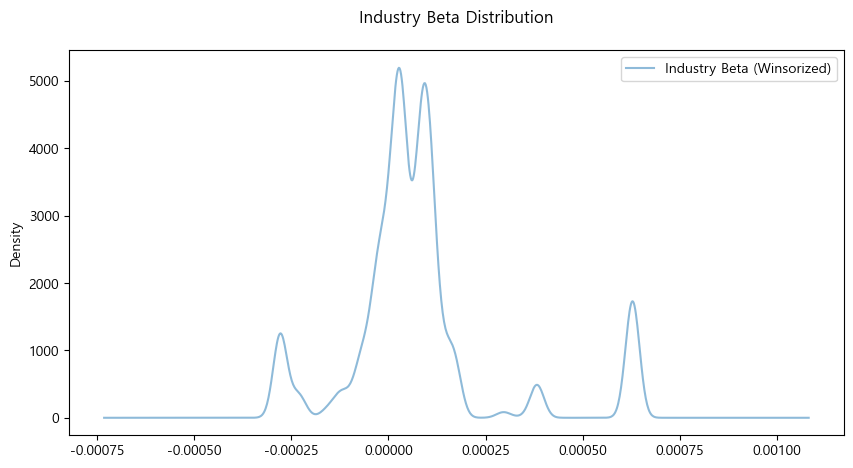

In [17]:
from scipy.stats.mstats import winsorize

filtered_data = df.loc[~df["delta_cashflow"].isna(), "beta_ind"]
winsorized_data = winsorize(filtered_data, limits=[0.05, 0.05])


pd.Series(winsorized_data).plot(
    kind="kde", alpha=0.5, figsize=(10, 5),
    label="Industry Beta (Winsorized)", legend=True, title="Industry Beta Distribution",
)

<Axes: title={'center': 'Oil Price Growth Distribution'}, ylabel='Density'>

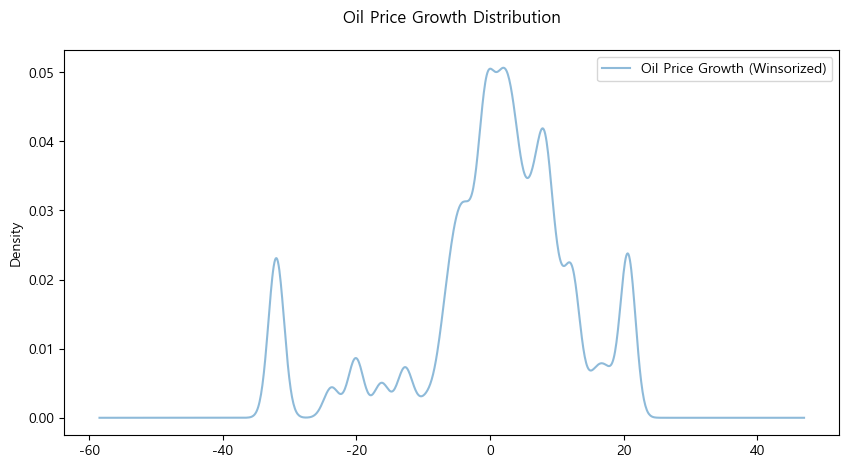

In [18]:
filtered_data = df.loc[~df["delta_cashflow"].isna(), "oil_price_growth"]
winsorized_data = winsorize(filtered_data, limits=[0.05, 0.05])


pd.Series(winsorized_data).plot(
    kind="kde", alpha=0.5, figsize=(10, 5),
    label="Oil Price Growth (Winsorized)", legend=True, title="Oil Price Growth Distribution",
)

<Axes: title={'center': 'Industry Shock Distribution [Mid-Class]'}, ylabel='Density'>

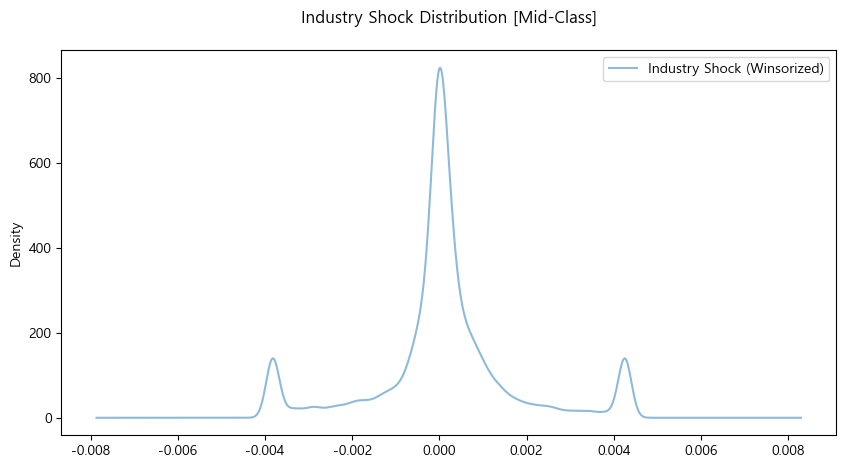

In [19]:
filtered_data = df.loc[~df["delta_cashflow"].isna(), "ind_shock"]
winsorized_data = winsorize(filtered_data, limits=[0.05, 0.05])


pd.Series(winsorized_data).plot(
    kind="kde", alpha=0.5, figsize=(10, 5),
    label="Industry Shock (Winsorized)", legend=True, title="Industry Shock Distribution [Mid-Class]",
)

<Axes: title={'center': 'Industry Shock Distribution [Mid-Class]'}, ylabel='Frequency'>

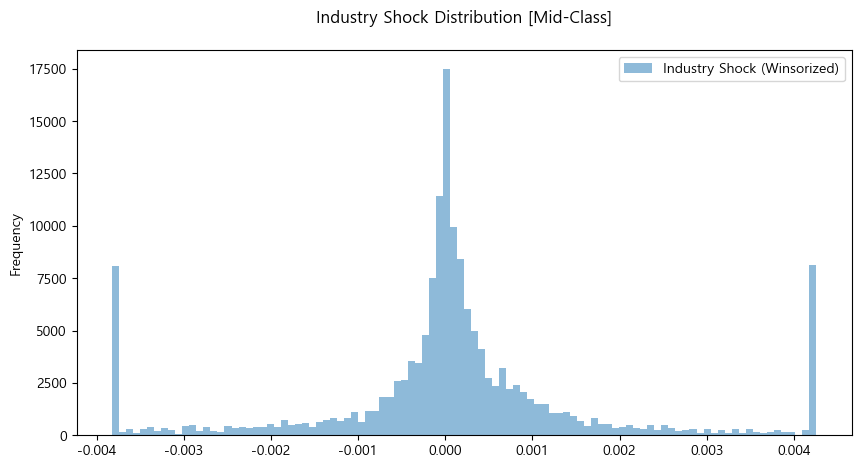

In [20]:
pd.Series(winsorized_data).plot(
    kind="hist", bins=100, alpha=0.5, figsize=(10, 5),
    label="Industry Shock (Winsorized)", legend=True, title="Industry Shock Distribution [Mid-Class]",
)

In [21]:
df.to_csv("./dataset/working_capital_dataset_oil.csv", index=False, encoding="utf8")

# Table

- C(~~): Categorical Variable를 지칭 (범주형 변수)
- ! Control은 따로 명시하지 않아도 알아서 ?

In [55]:
import os

categorical_vars_path = "categorical_vars"
os.makedirs(categorical_vars_path, exist_ok=True)
categorical_vars_path = "categorical_vars" + "/interact"
os.makedirs(categorical_vars_path, exist_ok=True)

In [56]:
def _result_table(model):
    results_table = pd.DataFrame({
        'Variable': model.params.index,
        'Coefficient': model.params.values,
        't-value': model.tvalues.values,
        'p-value': model.pvalues.values,
        'observations': int(model.nobs),
        'R-squared': model.rsquared
    })
    results_table['Significance'] = results_table['p-value'].apply(
        lambda p: '***' if p < 0.01 else '**' if p < 0.05 else '*' if p < 0.1 else ''
    )
    return results_table

def summary_table(model):
    results_table = _result_table(model)
    filtered_results = results_table[~results_table['Variable'].str.contains("C\(")].reset_index(drop=True).T
    filtered_results.columns = filtered_results.loc["Variable"]
    return filtered_results.drop("Variable")

def summary_survival_table(model):
    filtered_results = _result_table(model).reset_index(drop=True)
    filtered_results = filtered_results[filtered_results["p-value"]< 0.05].reset_index(drop=True).T
    filtered_results.columns = filtered_results.loc["Variable"]
    return filtered_results.drop("Variable")

formula_str = lambda f: f"{f['Y']} ~ {' + '.join(f['X'])}"
formula_var = lambda x: [(xx[2:-1] if xx[:2]=="C(" else xx) for xx in x]

In [57]:
condition = (~df["delta_cashflow"].isna()) & (~df["firm_type"].isna()) & (df["beta_ind"]<=0)

In [58]:
# to avoid SVD did not converge error
table_cut = lambda table, col: table[table[col].map(table[col].value_counts()) > 1] 

In [83]:
df.firm_type.value_counts(dropna=False)

firm_type
NaN               170799
1.000000000000     37111
2.000000000000     30469
4.000000000000     29417
3.000000000000     28610
Name: count, dtype: int64

In [59]:
import statsmodels.formula.api as smf

# 절편 없이 회귀분석
def ols_model(data, formula, title="", filter_var=None):
    if filter_var:
        data = data[data[filter_var]==1]

    temp_data = data.loc[
        (data["drop_size_dummy"]==False) 
    ].dropna(subset=[formula["Y"]])
    model = smf.ols(formula=formula_str(formula) + " + 0", data=temp_data).fit()
    if title:
        print(title)
        print(formula_str(formula) + " + 0")
        print()
        print(model.summary())
    return model

In [60]:
def num_obs(data):
    t = data['IndustryQuarterFE'].value_counts().reset_index()
    t["industry"] = t["IndustryQuarterFE"].str.split("_").str[0].astype(float).astype(int)
    t["quarter"] = t["IndustryQuarterFE"].str.split("_").str[1]

    plt.figure(figsize=(20, 15))
    sns.heatmap(
        t.pivot(index="industry", columns="quarter", values="count"), annot=False, fmt=".0f", cmap="YlGnBu",
        cbar=True, square=True, xticklabels=True, yticklabels=True, 
        annot_kws={"fontsize": 7}, cbar_kws={"shrink": 0.5, "pad": 0.01}, robust=True,
    )
    plt.title(label = "Number of Observations by Industry and Quarter\nBefore Dropping Top 33% Asset", fontsize=20)
    plt.xticks(rotation=45)
    plt.show()

## Table 2

In [19]:
df_table2 = df.loc[condition, [
    "firmcode", "date", "firm_type", "main_quarter", "sup_fin_tercile", 
    "oil_price_growth", "beta_firm", "beta_ind", "ind_shock", "cashflow", "cashflow_01",
    "avg_age", "avg_size", "avg_q", "avg_cashflow", "ind_code", ind_code_class, "drop_size_dummy",
    "delta_log_payab_01", "delta_log_st_asset_01", "delta_log_sales_01",
]].copy().rename(columns={
    "beta_ind": "OilExposure",
    "cashflow": "CashFlow", "cashflow_01": "CashFlow_t_plus_1", "avg_age": "Avg_Age", "avg_size": "Avg_Size", 
    "avg_q": "Avg_Q", "avg_cashflow": "Avg_CashFlow", ind_code_class: "Industry", "sup_fin_tercile": "SupFinTercile",
    "main_quarter": "MainQuarter", "firm_type": "FirmType", "oil_price_growth": "OilPriceGrowth", 
    "delta_log_payab_01": "DeltaLogAP", "delta_log_st_asset_01": "DeltaLogStAsset", "delta_log_sales_01": "DeltaLogSales"
}).dropna(subset=["FirmType", "Industry", "ind_shock"])


### Panel A: Seasonality in Firm Profitability - Main Quarter Effect

In [20]:
df_table2['Industry'] = df_table2['Industry'].astype('category')  
df_table2['Quarter'] = df_table2['date'].astype('category')  
df_table2["FirmType"] = df_table2["FirmType"].astype('category')

df_table2['IndustryQuarterFE'] = df_table2['Industry'].astype(str) + "_" + df_table2['Quarter'].astype(str)
df_table2['IndustryQuarterFE'] = df_table2['IndustryQuarterFE'].astype('category')

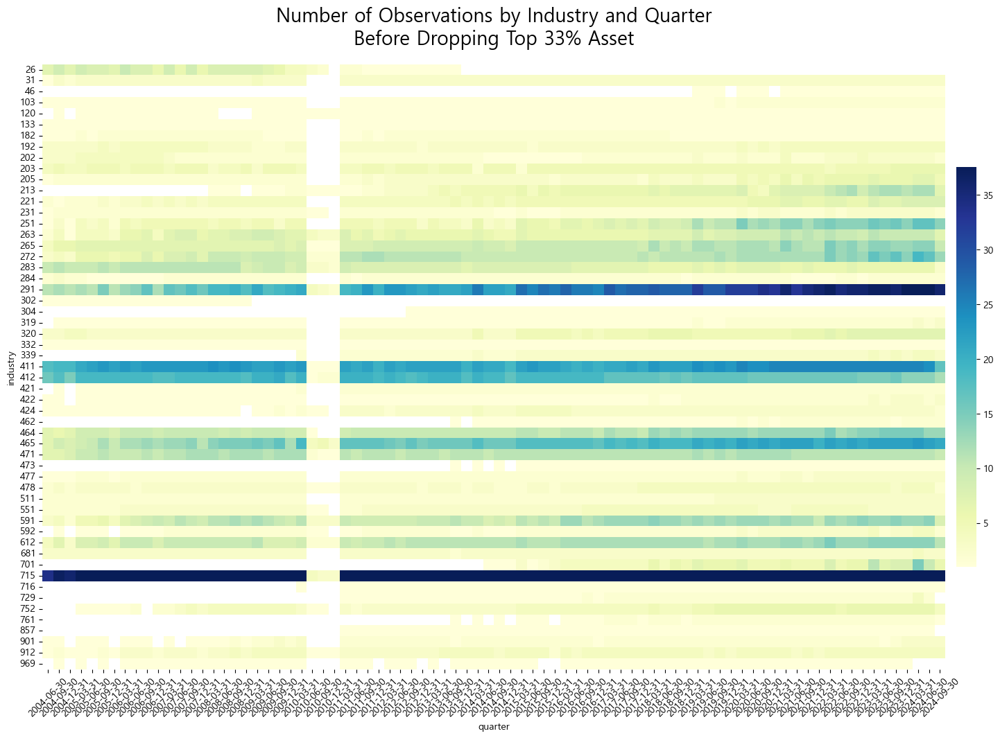

In [21]:
num_obs(df_table2)

In [22]:
# t["IndustryQuarterFE"].value_counts().sort_index()

In [23]:
# interaction_counts = df_table2.groupby(['IndustryQuarterFE', 'FirmType'], observed=False).size()
# print(interaction_counts[interaction_counts <= 3].reset_index()["IndustryQuarterFE"].unique())  # 빈도가 낮은 조합 확인

In [24]:
df_table2_a = df_table2 #table_cut(df_table2, "IndustryQuarterFE")

In [25]:
formula_t = {
    "X": [
        "MainQuarter", "C(IndustryQuarterFE)", "C(FirmType)"
    ],
    "Y": "CashFlow"
}


formula_t_plus_1 = {
    "X": [
        "MainQuarter", "C(IndustryQuarterFE)", "C(FirmType)"
    ],
    "Y": "CashFlow_t_plus_1"
}

print(formula_str(formula_t), formula_var(formula_t["X"]))

CashFlow ~ MainQuarter + C(IndustryQuarterFE) + C(FirmType) ['MainQuarter', 'IndustryQuarterFE', 'FirmType']


In [26]:
# df_table2_a[df_table2_a[formula_t["Y"]].notna()]["Industry"].value_counts().to_frame().sort_index().T

In [27]:
df_table2_a[df_table2_a[formula_t["Y"]].notna()][["drop_size_dummy", "SupFinTercile"]].value_counts().to_frame().sort_index(ascending=False)

count
drop_size_dummy SupFinTercile       
True            top             3777
                mid             2990
                low             4853
False           top             4052
                mid             4285
                low             4158

In [28]:
df_table2_a.loc[(df_table2_a["drop_size_dummy"]==False), [
    "MainQuarter", "IndustryQuarterFE", "FirmType", "CashFlow"
]].info()

<class 'pandas.core.frame.DataFrame'>
Index: 12521 entries, 50929 to 295810
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   MainQuarter        12521 non-null  float64 
 1   IndustryQuarterFE  12521 non-null  category
 2   FirmType           12521 non-null  category
 3   CashFlow           12521 non-null  float64 
dtypes: category(2), float64(2)
memory usage: 490.0 KB


In [29]:
df_table2_a.loc[(df_table2_a["drop_size_dummy"]==False), [
    "MainQuarter", "IndustryQuarterFE", "FirmType", "CashFlow"
]].describe()

,MainQuarter,CashFlow
count,12521.000000000000,12521.000000000000
mean,0.247424327130,0.005953070112
std,0.431532619996,0.026747650608
min,0.000000000000,-0.106830602124
25%,0.000000000000,-0.006535188741
50%,0.000000000000,0.006225832178
75%,0.000000000000,0.019690650278
max,1.000000000000,0.104222401888


In [30]:
model_t = ols_model(
    df_table2_a, formula_t, title = "Table II - Panel A (1): Cash Flow (t)"
)
summary_survival_table(model_t).T.to_csv(f"./{categorical_vars_path}/t2_a_1.csv")

Table II - Panel A (1): Cash Flow (t)
CashFlow ~ MainQuarter + C(IndustryQuarterFE) + C(FirmType) + 0

                            OLS Regression Results                            
Dep. Variable:               CashFlow   R-squared:                       0.346
Model:                            OLS   Adj. R-squared:                  0.111
Method:                 Least Squares   F-statistic:                     1.474
Date:                Sun, 15 Dec 2024   Prob (F-statistic):           2.10e-44
Time:                        15:37:25   Log-Likelihood:                 30232.
No. Observations:               12521   AIC:                        -5.386e+04
Df Residuals:                    9217   BIC:                        -2.929e+04
Df Model:                        3303                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]


In [31]:
summary_table(model_t)

Variable,MainQuarter
Coefficient,-0.000182599390
t-value,-0.288142214777
p-value,0.773244358442
observations,12521
R-squared,0.345692634163
Significance,


In [32]:
model_t_plus_1 = ols_model(
    df_table2_a, formula_t_plus_1, title = "Table II - Panel A (2): Cash Flow (t, t+1)"
)
summary_survival_table(model_t_plus_1).T.to_csv(f"./{categorical_vars_path}/t2_a_2.csv")

Table II - Panel A (2): Cash Flow (t, t+1)
CashFlow_t_plus_1 ~ MainQuarter + C(IndustryQuarterFE) + C(FirmType) + 0

                            OLS Regression Results                            
Dep. Variable:      CashFlow_t_plus_1   R-squared:                       0.364
Model:                            OLS   Adj. R-squared:                  0.130
Method:                 Least Squares   F-statistic:                     1.553
Date:                Sun, 15 Dec 2024   Prob (F-statistic):           7.28e-55
Time:                        15:38:22   Log-Likelihood:                 22371.
No. Observations:               11918   AIC:                        -3.832e+04
Df Residuals:                    8709   BIC:                        -1.462e+04
Df Model:                        3208                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.02

In [33]:
summary_table(model_t_plus_1)

Variable,MainQuarter
Coefficient,-0.000195638119
t-value,-0.174493061462
p-value,0.861482039272
observations,11918
R-squared,0.363933102838
Significance,


### Panel B

In [34]:
df_table2["TopSupFin"] = (df_table2["SupFinTercile"] == "top").astype(int)
df_table2["MidSupFin"] = (df_table2["SupFinTercile"] == "mid").astype(int)

df_table2["APStAsset"] = df_table2["DeltaLogAP"] - df_table2["DeltaLogStAsset"]
df_table2["APSales"] = df_table2["DeltaLogAP"] - df_table2["DeltaLogSales"]

In [35]:
df_table2['Industry'] = df_table2['Industry'].astype('category')  
df_table2['Quarter'] = df_table2['date'].astype('category')  
df_table2["FirmType"] = df_table2["FirmType"].astype('category')
df_table2["SupFinTercile"] = df_table2["SupFinTercile"].astype('category')
df_table2["MQuarter"] = df_table2["MainQuarter"].astype('category')

df_table2["MQuarterAvgAge"] = df_table2["MainQuarter"] * df_table2["Avg_Age"]
df_table2["MQuarterAvgSize"] = df_table2["MainQuarter"] * df_table2["Avg_Size"]
df_table2["MQuarterAvgQ"] = df_table2["MainQuarter"] * df_table2["Avg_Q"]
df_table2["MQuarterAvgCashFlow"] = df_table2["MainQuarter"] * df_table2["Avg_CashFlow"]


df_table2['IndustryQuarterFE'] = df_table2['Industry'].astype(str) + "_" + df_table2['Quarter'].astype(str)
df_table2["IndustryQuarterSupFinTercileFE"] = df_table2["IndustryQuarterFE"] + "_" + df_table2["SupFinTercile"].astype(str)
df_table2["IndustryQuarterTopSupFinFE"] = df_table2["IndustryQuarterFE"] + "_" + df_table2["TopSupFin"].astype('category').astype(str)

for v in [
    "IndustryQuarterFE", "IndustryQuarterSupFinTercileFE", "IndustryQuarterTopSupFinFE"
]:
    df_table2[v] = df_table2[v].astype('category')

# df_table2 = df_table2[df_table2['IndustryQuarterSupFinTercileFE'].map(df_table2['IndustryQuarterSupFinTercileFE'].value_counts()) > 2]

df_table2_b = df_table2 #table_cut(df_table2, "IndustryQuarterSupFinTercileFE")
df_table2_b5 = df_table2 #table_cut(df_table2, "IndustryQuarterTopSupFinFE")

In [36]:
formula_1 = {
    "X": [
        "MainQuarter * TopSupFin", "MainQuarter * MidSupFin",
        "C(IndustryQuarterSupFinTercileFE)", "C(FirmType)"  # Control Variables
    ],
    "Y": "APStAsset"
}

formula_2 = {
    "X": [
        "MainQuarter * TopSupFin", "MainQuarter * MidSupFin",
        "MQuarterAvgAge", "MQuarterAvgSize", "MQuarterAvgQ", # Control Variables
        "C(IndustryQuarterSupFinTercileFE)", "C(FirmType)"  # Control Variables
    ],
    "Y": "APStAsset"
}



formula_3 = {
    "X": [
        "MainQuarter * TopSupFin",
        "C(IndustryQuarterTopSupFinFE)", "C(FirmType)"
    ],
    "Y": "APStAsset"
}

formula_4 = {
    "X": [
        "MainQuarter * TopSupFin", 
        "MQuarterAvgAge", "MQuarterAvgSize", "MQuarterAvgQ", # Control Variables
        "C(IndustryQuarterTopSupFinFE)", "C(FirmType)"  # Control Variables
    ],
    "Y": "APStAsset"
}


formula_5 = {
    "X": [
        "MainQuarter * TopSupFin",
        "C(IndustryQuarterTopSupFinFE)", "C(FirmType)"
    ],
    "Y": "APSales"
}

formula_6 = {
    "X": [
        "MainQuarter * TopSupFin",
        "MQuarterAvgAge", "MQuarterAvgSize", "MQuarterAvgQ", # Control Variables
        "C(IndustryQuarterTopSupFinFE)", "C(FirmType)"
    ],
    "Y": "APSales"
}

print(formula_str(formula_5))
print(formula_var(formula_5["X"]))

APSales ~ MainQuarter * TopSupFin + C(IndustryQuarterTopSupFinFE) + C(FirmType)
['MainQuarter * TopSupFin', 'IndustryQuarterTopSupFinFE', 'FirmType']


In [37]:
model_1 = ols_model(
    df_table2_b, formula_1, title = "Table II - Panel B (1): Delta Log AP - Delta Log St Asset"
) 
summary_survival_table(model_1).T.to_csv(f"./{categorical_vars_path}/t2_b_1.csv")

Table II - Panel B (1): Delta Log AP - Delta Log St Asset
APStAsset ~ MainQuarter * TopSupFin + MainQuarter * MidSupFin + C(IndustryQuarterSupFinTercileFE) + C(FirmType) + 0

                            OLS Regression Results                            
Dep. Variable:              APStAsset   R-squared:                       0.530
Model:                            OLS   Adj. R-squared:                  0.100
Method:                 Least Squares   F-statistic:                     1.232
Date:                Sun, 15 Dec 2024   Prob (F-statistic):           2.47e-16
Time:                        15:44:33   Log-Likelihood:                -25519.
No. Observations:               12136   AIC:                         6.264e+04
Df Residuals:                    6335   BIC:                         1.056e+05
Df Model:                        5800                                         
Covariance Type:            nonrobust                                         
                                   

In [38]:
summary_table(model_1)

Variable,MainQuarter,TopSupFin,MainQuarter:TopSupFin,MidSupFin,MainQuarter:MidSupFin
Coefficient,-0.091911694327,-0.275578610743,0.110124040197,-0.006454213696,-0.020908626230
t-value,-0.606897647949,-3.413593361641,0.538648584695,-0.079526813730,-0.100897506708
p-value,0.543940588454,0.000645140103,0.590148283082,0.936616116783,0.919635015328
observations,12136,12136,12136,12136,12136
R-squared,0.530000203887,0.530000203887,0.530000203887,0.530000203887,0.530000203887
Significance,,***,,,


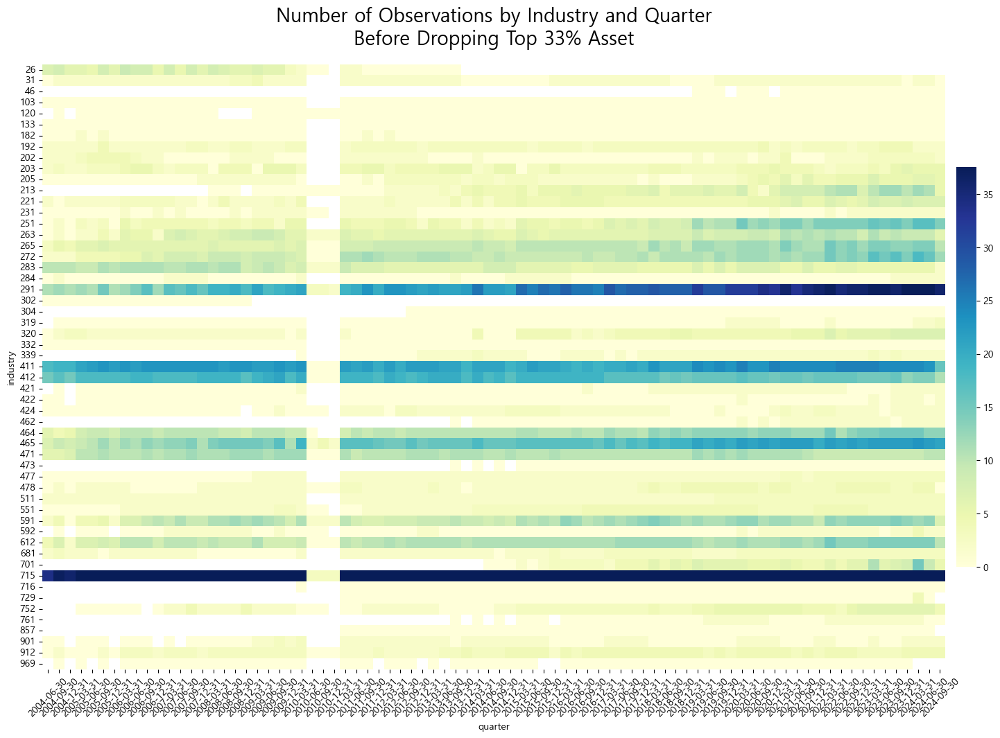

In [41]:
df_table2_b = table_cut(df_table2_b, "IndustryQuarterSupFinTercileFE")
num_obs(df_table2_b)

In [42]:
model_2 = ols_model(
    df_table2_b, formula_2, title = "Table II - Panel B (2): Delta Log AP - Delta Log St Asset"
) 
summary_survival_table(model_2).T.to_csv(f"./{categorical_vars_path}/t2_b_2.csv")

LinAlgError: SVD did not converge

In [ ]:
summary_table(model_2)

In [43]:
model_3 = ols_model(
    df_table2_b, formula_3, title = "Table II - Panel B (3): Delta Log AP - Delta Log St Asset"
) 
summary_survival_table(model_3).T.to_csv(f"./{categorical_vars_path}/t2_b_3.csv")

Table II - Panel B (3): Delta Log AP - Delta Log St Asset
APStAsset ~ MainQuarter * TopSupFin + C(IndustryQuarterTopSupFinFE) + C(FirmType) + 0

                            OLS Regression Results                            
Dep. Variable:              APStAsset   R-squared:                       0.332
Model:                            OLS   Adj. R-squared:                  0.039
Method:                 Least Squares   F-statistic:                     1.132
Date:                Sun, 15 Dec 2024   Prob (F-statistic):           2.11e-05
Time:                        16:04:02   Log-Likelihood:                -22971.
No. Observations:               10125   AIC:                         5.213e+04
Df Residuals:                    7033   BIC:                         7.446e+04
Df Model:                        3091                                         
Covariance Type:            nonrobust                                         
                                                        coef    s

In [44]:
summary_table(model_3)

Variable,MainQuarter,TopSupFin,MainQuarter:TopSupFin
Coefficient,-0.036268889046,93233744.411321461201,0.053686587266
t-value,-0.367977783155,0.092227845846,0.313382663908
p-value,0.712900874082,0.926519641327,0.753999246771
observations,10125,10125,10125
R-squared,0.332205267594,0.332205267594,0.332205267594
Significance,,,


In [45]:
model_4 = ols_model(
    df_table2_b, formula_4, title = "Table II - Panel B (4): Delta Log AP - Delta Log St Asset"
) 
summary_survival_table(model_4).T.to_csv(f"./{categorical_vars_path}/t2_b_4.csv")

Table II - Panel B (4): Delta Log AP - Delta Log St Asset
APStAsset ~ MainQuarter * TopSupFin + MQuarterAvgAge + MQuarterAvgSize + MQuarterAvgQ + C(IndustryQuarterTopSupFinFE) + C(FirmType) + 0

                            OLS Regression Results                            
Dep. Variable:              APStAsset   R-squared:                       0.332
Model:                            OLS   Adj. R-squared:                  0.038
Method:                 Least Squares   F-statistic:                     1.131
Date:                Sun, 15 Dec 2024   Prob (F-statistic):           2.38e-05
Time:                        16:10:21   Log-Likelihood:                -22970.
No. Observations:               10125   AIC:                         5.213e+04
Df Residuals:                    7030   BIC:                         7.448e+04
Df Model:                        3094                                         
Covariance Type:            nonrobust                                         
               

In [46]:
summary_table(model_4)

Variable,MainQuarter,TopSupFin,MainQuarter:TopSupFin,MQuarterAvgAge,MQuarterAvgSize,MQuarterAvgQ
Coefficient,1.720516860605,-0.221416609594,0.045845268778,0.003882668804,-0.076550230189,0.025862138652
t-value,0.637801452406,-2.632640492991,0.263850034097,0.715754441530,-0.706974618995,0.431266106272
p-value,0.523623706818,0.008490925604,0.791903212237,0.474166760325,0.479605683322,0.666288115718
observations,10125,10125,10125,10125,10125,10125
R-squared,0.332321120223,0.332321120223,0.332321120223,0.332321120223,0.332321120223,0.332321120223
Significance,,***,,,,


In [47]:
model_5 = ols_model(
    df_table2_b5, formula_5, title = "Table II - Panel B (5): Delta Log AP - Delta Log Sales"
) 
summary_survival_table(model_5).T.to_csv(f"./{categorical_vars_path}/t2_b_5.csv")

Table II - Panel B (5): Delta Log AP - Delta Log Sales
APSales ~ MainQuarter * TopSupFin + C(IndustryQuarterTopSupFinFE) + C(FirmType) + 0

                            OLS Regression Results                            
Dep. Variable:                APSales   R-squared:                       0.394
Model:                            OLS   Adj. R-squared:                  0.031
Method:                 Least Squares   F-statistic:                     1.086
Date:                Sun, 15 Dec 2024   Prob (F-statistic):           0.000840
Time:                        16:13:10   Log-Likelihood:                -27967.
No. Observations:               12317   AIC:                         6.517e+04
Df Residuals:                    7701   BIC:                         9.941e+04
Df Model:                        4615                                         
Covariance Type:            nonrobust                                         
                                                        coef    std er

In [48]:
summary_table(model_5)

Variable,MainQuarter,TopSupFin,MainQuarter:TopSupFin
Coefficient,-0.010844395977,-0.339202539393,-0.012692326564
t-value,-0.111656753532,-4.026649047513,-0.071493105656
p-value,0.911098480455,0.000057120424,0.943007167905
observations,12317,12317,12317
R-squared,0.394207575299,0.394207575299,0.394207575299
Significance,,***,


In [49]:
model_6 = ols_model(
    df_table2_b5, formula_6, title = "Table II - Panel B (6): Delta Log AP - Delta Log Sales"
) 
summary_survival_table(model_6).T.to_csv(f"./{categorical_vars_path}/t2_b_6.csv")

Table II - Panel B (6): Delta Log AP - Delta Log Sales
APSales ~ MainQuarter * TopSupFin + MQuarterAvgAge + MQuarterAvgSize + MQuarterAvgQ + C(IndustryQuarterTopSupFinFE) + C(FirmType) + 0

                            OLS Regression Results                            
Dep. Variable:                APSales   R-squared:                       0.394
Model:                            OLS   Adj. R-squared:                  0.031
Method:                 Least Squares   F-statistic:                     1.086
Date:                Sun, 15 Dec 2024   Prob (F-statistic):           0.000867
Time:                        16:15:28   Log-Likelihood:                -27965.
No. Observations:               12317   AIC:                         6.517e+04
Df Residuals:                    7698   BIC:                         9.944e+04
Df Model:                        4618                                         
Covariance Type:            nonrobust                                         
                    

In [50]:
summary_table(model_6)

Variable,MainQuarter,TopSupFin,MainQuarter:TopSupFin,MQuarterAvgAge,MQuarterAvgSize,MQuarterAvgQ
Coefficient,3.978646878991,-0.333495251692,-0.027764867697,0.003515228436,-0.163609022319,-0.006346167971
t-value,1.444269834966,-3.949900957444,-0.154604874858,0.655986512343,-1.481825328348,-0.101942617846
p-value,0.148703785320,0.000078881339,0.877136879722,0.511852407935,0.138427709053,0.918804877122
observations,12317,12317,12317,12317,12317,12317
R-squared,0.394396752948,0.394396752948,0.394396752948,0.394396752948,0.394396752948,0.394396752948
Significance,,***,,,,


# Table 3

In [61]:
df_table3 = df.loc[condition, [
    "firmcode", "date", "firm_type", "main_quarter", "sup_fin_tercile", 
    "ind_shock", "cashflow", "oil_price_growth", "beta_ind",
    "avg_age", "avg_size", "avg_q", "avg_cashflow", "ind_code", ind_code_class, "drop_size_dummy",
    "delta_log_sales_01", "delta_log_sales_23",
    "age",
]].copy().rename(columns={
    "cashflow": "CashFlow", "avg_age": "Avg_Age", "avg_size": "Avg_Size", 
    "avg_q": "Avg_Q", "avg_cashflow": "Avg_CashFlow", ind_code_class: "Industry", "sup_fin_tercile": "SupFinTercile",
    "main_quarter": "MainQuarter", "firm_type": "FirmType",  
    "ind_shock": "IndustryShock", "age": "FirmAge",  "oil_price_growth": "OilPriceGrowth", "beta_ind": "OilExposure",
    "delta_log_sales_23": "DeltaLogSales23", "delta_log_sales_01": "DeltaLogSales01"
}).dropna(subset=["FirmType", "Industry"])

In [62]:
df_table3["TopSupFin"] = (df_table3["SupFinTercile"] == "top").astype(int)
df_table3["MidSupFin"] = (df_table3["SupFinTercile"] == "mid").astype(int)
df_table3["BottomSupFin"] = (df_table3["SupFinTercile"] == "low").astype(int)

df_table3['Industry'] = df_table3['Industry'].astype('category')  
df_table3['Quarter'] = df_table3['date'].astype('category')  
# df_table3["FirmType"] = df_table3["FirmType"].astype('category')
df_table3["MQuarter"] = df_table3["MainQuarter"] #.astype('category')

# Shock by Firm Type FE
for i in range(1, 5):   
    df_table3[f"Q{i}"] = (df_table3["FirmType"] == i).astype(int)
for v in ["OilExposure", "OilPriceGrowth", "IndustryShock"]:
    for i in range(1, 5):   
        df_table3[f"{v}XQ{i}"] = df_table3[v] * df_table3[f"Q{i}"]

df_table3['IndustryQuarterFE'] = df_table3['Industry'].astype(str) + "_" + df_table3['Quarter'].astype(str)
df_table3["IndustryQuarterTopSupFinFE"] = df_table3["IndustryQuarterFE"] + "_" + df_table3["TopSupFin"].astype('category').astype(str)


# Shock by MQuarter FE
# df_table3["OilExposureMQuarter"] = df_table3["MQuarter"] * df_table3["OilExposure"]
# df_table3["OilPriceGrowthMQuarter"] = df_table3["MQuarter"] * df_table3["OilPriceGrowth"]
# df_table3["IndustryShockMQuarter"] = df_table3["MQuarter"] * df_table3["IndustryShock"]

# Shock by MQuarter by Firm Age FE
for v in ["OilExposure", "OilPriceGrowth", "IndustryShock"]:
    df_table3[f"{v}XMQuarterXAvgAge"] = df_table3["MainQuarter"] * df_table3[v] * df_table3["Avg_Age"]


for v in [
    "IndustryQuarterFE", "IndustryQuarterTopSupFinFE", "MQuarter", "FirmType"
]:
    df_table3[v] = df_table3[v].astype('category')

In [63]:
shock_by_mquarter_by_firm_age_FE = [
    f"{category}XMQuarterXAvgAge" 
    for category in ["OilExposure", "OilPriceGrowth", "IndustryShock"]
]

shock_by_firm_type_FE = [
    f"{category}XQ{i}" 
    for category in ["OilExposure", "OilPriceGrowth", "IndustryShock"] 
    for i in range(1, 5)
]

In [64]:
df_table3_a = df_table3 #table_cut(df_table3, "IndustryQuarterFE")
df_table3_b = df_table3 #table_cut(df_table3, "IndustryQuarterTopSupFinFE")

### Panel A

In [65]:
formula_123 = {
    "X": [
        "IndustryShock * MainQuarter", 
        "C(IndustryQuarterFE)", 
    ] + shock_by_firm_type_FE,
    "Y": "DeltaLogSales01"
}

formula_456 = {
    "X": formula_123["X"],
    "Y": "DeltaLogSales23"
}

print(formula_str(formula_123))
print(formula_var(formula_123["X"]))

DeltaLogSales01 ~ IndustryShock * MainQuarter + C(IndustryQuarterFE) + OilExposureXQ1 + OilExposureXQ2 + OilExposureXQ3 + OilExposureXQ4 + OilPriceGrowthXQ1 + OilPriceGrowthXQ2 + OilPriceGrowthXQ3 + OilPriceGrowthXQ4 + IndustryShockXQ1 + IndustryShockXQ2 + IndustryShockXQ3 + IndustryShockXQ4
['IndustryShock * MainQuarter', 'IndustryQuarterFE', 'OilExposureXQ1', 'OilExposureXQ2', 'OilExposureXQ3', 'OilExposureXQ4', 'OilPriceGrowthXQ1', 'OilPriceGrowthXQ2', 'OilPriceGrowthXQ3', 'OilPriceGrowthXQ4', 'IndustryShockXQ1', 'IndustryShockXQ2', 'IndustryShockXQ3', 'IndustryShockXQ4']


In [66]:
model_1 = ols_model(
    df_table3[df_table3["TopSupFin"]==1], 
    formula_123, title = "Table III - Panel A (1): Delta Log Sales (t, t+1) ~ TopSupFin"
)
summary_survival_table(model_1).T.to_csv(f"./{categorical_vars_path}/t3_a_1.csv")

Table III - Panel A (1): Delta Log Sales (t, t+1) ~ TopSupFin
DeltaLogSales01 ~ IndustryShock * MainQuarter + C(IndustryQuarterFE) + OilExposureXQ1 + OilExposureXQ2 + OilExposureXQ3 + OilExposureXQ4 + OilPriceGrowthXQ1 + OilPriceGrowthXQ2 + OilPriceGrowthXQ3 + OilPriceGrowthXQ4 + IndustryShockXQ1 + IndustryShockXQ2 + IndustryShockXQ3 + IndustryShockXQ4 + 0

                            OLS Regression Results                            
Dep. Variable:        DeltaLogSales01   R-squared:                       0.516
Model:                            OLS   Adj. R-squared:                  0.158
Method:                 Least Squares   F-statistic:                     1.443
Date:                Mon, 16 Dec 2024   Prob (F-statistic):           1.23e-16
Time:                        16:48:48   Log-Likelihood:                -2352.3
No. Observations:                4038   AIC:                             8137.
Df Residuals:                    2322   BIC:                         1.895e+04
Df Model

In [67]:
summary_table(model_1)

Variable,IndustryShock,MainQuarter,IndustryShock:MainQuarter,OilExposureXQ1,OilExposureXQ2,OilExposureXQ3,OilExposureXQ4,OilPriceGrowthXQ1,OilPriceGrowthXQ2,OilPriceGrowthXQ3,OilPriceGrowthXQ4,IndustryShockXQ1,IndustryShockXQ2,IndustryShockXQ3,IndustryShockXQ4
Coefficient,-0.022880799372,0.045740202156,-2.517212429557,-16.519858728418,1.297680539891,62.730137166155,-47.508735775231,0.002363091716,-0.002331636416,-0.000155127976,0.000885228034,1.160806159205,-2.224258384429,0.352448426649,0.688122999203
t-value,-0.285173023792,1.580533337968,-0.767819296166,-0.414083011223,0.031362503101,1.370685919916,-1.059882244191,1.582062157908,-1.545979481464,-0.084703801335,0.497419953076,0.408313163108,-0.793926846081,0.102011954636,0.219576921689
p-value,0.775537019553,0.114120976776,0.442672620649,0.678851559141,0.974983139992,0.170605364513,0.289308408588,0.113771570336,0.122245794023,0.932504175841,0.618940035496,0.683081425177,0.427319145852,0.918755994251,0.826219966750
observations,4038,4038,4038,4038,4038,4038,4038,4038,4038,4038,4038,4038,4038,4038,4038
R-squared,0.515909798137,0.515909798137,0.515909798137,0.515909798137,0.515909798137,0.515909798137,0.515909798137,0.515909798137,0.515909798137,0.515909798137,0.515909798137,0.515909798137,0.515909798137,0.515909798137,0.515909798137
Significance,,,,,,,,,,,,,,,


In [68]:
model_2 = ols_model(
    df_table3[df_table3["MidSupFin"]==1], 
    formula_123, title = "Table III - Panel A (2): Delta Log Sales (t, t+1) ~ MidSupFin"
)
summary_survival_table(model_2).T.to_csv(f"./{categorical_vars_path}/t3_a_2.csv")

Table III - Panel A (2): Delta Log Sales (t, t+1) ~ MidSupFin
DeltaLogSales01 ~ IndustryShock * MainQuarter + C(IndustryQuarterFE) + OilExposureXQ1 + OilExposureXQ2 + OilExposureXQ3 + OilExposureXQ4 + OilPriceGrowthXQ1 + OilPriceGrowthXQ2 + OilPriceGrowthXQ3 + OilPriceGrowthXQ4 + IndustryShockXQ1 + IndustryShockXQ2 + IndustryShockXQ3 + IndustryShockXQ4 + 0

                            OLS Regression Results                            
Dep. Variable:        DeltaLogSales01   R-squared:                       0.430
Model:                            OLS   Adj. R-squared:                 -0.077
Method:                 Least Squares   F-statistic:                    0.8484
Date:                Mon, 16 Dec 2024   Prob (F-statistic):               1.00
Time:                        16:49:41   Log-Likelihood:                -1233.5
No. Observations:                4279   AIC:                             6497.
Df Residuals:                    2264   BIC:                         1.932e+04
Df Model

In [69]:
summary_table(model_2)

Variable,IndustryShock,MainQuarter,IndustryShock:MainQuarter,OilExposureXQ1,OilExposureXQ2,OilExposureXQ3,OilExposureXQ4,OilPriceGrowthXQ1,OilPriceGrowthXQ2,OilPriceGrowthXQ3,OilPriceGrowthXQ4,IndustryShockXQ1,IndustryShockXQ2,IndustryShockXQ3,IndustryShockXQ4
Coefficient,-0.056293936407,-0.035455793674,0.750524960210,16.390168336025,-14.629209691502,31.535533405587,-33.288858752106,0.001575628043,0.000720187328,-0.000882634466,-0.000346478208,2.301528421205,-1.529050035651,-0.446271019264,-0.382501302697
t-value,-0.926950603712,-1.536554374148,0.268319920914,0.504555604158,-0.424934472437,0.906753551792,-0.959020530571,1.250495981583,0.601033117186,-0.633761999723,-0.240784104430,0.962056721468,-0.598150392000,-0.169219494676,-0.131629816235
p-value,0.354050984348,0.124542206596,0.788477518615,0.613920100549,0.670924825124,0.364633632646,0.337650804512,0.211247647393,0.547878096324,0.526300176608,0.809744251886,0.336123850428,0.549799418989,0.865639113634,0.895288796617
observations,4279,4279,4279,4279,4279,4279,4279,4279,4279,4279,4279,4279,4279,4279,4279
R-squared,0.430116466473,0.430116466473,0.430116466473,0.430116466473,0.430116466473,0.430116466473,0.430116466473,0.430116466473,0.430116466473,0.430116466473,0.430116466473,0.430116466473,0.430116466473,0.430116466473,0.430116466473
Significance,,,,,,,,,,,,,,,


In [70]:
model_3 = ols_model(
    df_table3[df_table3["BottomSupFin"]==1], 
    formula_123, title = "Table III - Panel A (3): Delta Log Sales (t, t+1) ~ BottomSupFin"
)
summary_survival_table(model_3).T.to_csv(f"./{categorical_vars_path}/t3_a_3.csv")

Table III - Panel A (3): Delta Log Sales (t, t+1) ~ BottomSupFin
DeltaLogSales01 ~ IndustryShock * MainQuarter + C(IndustryQuarterFE) + OilExposureXQ1 + OilExposureXQ2 + OilExposureXQ3 + OilExposureXQ4 + OilPriceGrowthXQ1 + OilPriceGrowthXQ2 + OilPriceGrowthXQ3 + OilPriceGrowthXQ4 + IndustryShockXQ1 + IndustryShockXQ2 + IndustryShockXQ3 + IndustryShockXQ4 + 0

                            OLS Regression Results                            
Dep. Variable:        DeltaLogSales01   R-squared:                       0.564
Model:                            OLS   Adj. R-squared:                  0.100
Method:                 Least Squares   F-statistic:                     1.215
Date:                Mon, 16 Dec 2024   Prob (F-statistic):           5.15e-06
Time:                        16:50:23   Log-Likelihood:                -1803.8
No. Observations:                4135   AIC:                             7878.
Df Residuals:                    2000   BIC:                         2.139e+04
Df Mo

In [71]:
summary_table(model_3)

Variable,IndustryShock,MainQuarter,IndustryShock:MainQuarter,OilExposureXQ1,OilExposureXQ2,OilExposureXQ3,OilExposureXQ4,OilPriceGrowthXQ1,OilPriceGrowthXQ2,OilPriceGrowthXQ3,OilPriceGrowthXQ4,IndustryShockXQ1,IndustryShockXQ2,IndustryShockXQ3,IndustryShockXQ4
Coefficient,-0.032212336076,-0.023073872584,1.106138226518,76.729568033306,-90.259296409780,-24.549116699773,38.091112241230,-0.000017885947,0.000211768985,0.000710362499,0.003979780479,-5.382395991587,-0.467035043390,0.839204393573,4.978014305329
t-value,-0.458217685586,-0.797679839242,0.219447340563,1.371268575854,-1.649492172341,-0.405474203668,0.642961741005,-0.012220782531,0.124844109216,0.420746057652,2.450132447568,-1.402357780766,-0.132856757503,0.188724509069,1.394214951455
p-value,0.646845836667,0.425151000772,0.826323989647,0.170445080673,0.099203881965,0.685172346269,0.520322629783,0.990250687863,0.900659512947,0.673985729869,0.014365527360,0.160963627542,0.894320031266,0.850327888958,0.163407565333
observations,4135,4135,4135,4135,4135,4135,4135,4135,4135,4135,4135,4135,4135,4135,4135
R-squared,0.564483655285,0.564483655285,0.564483655285,0.564483655285,0.564483655285,0.564483655285,0.564483655285,0.564483655285,0.564483655285,0.564483655285,0.564483655285,0.564483655285,0.564483655285,0.564483655285,0.564483655285
Significance,,,,,*,,,,,,**,,,,


In [72]:
model_4 = ols_model(
    df_table3[df_table3["TopSupFin"]==1], 
    formula_456, title = "Table III - Panel A (4): Delta Log Sales (t+2, t+3) ~ TopSupFin"
)
summary_survival_table(model_4).T.to_csv(f"./{categorical_vars_path}/t3_a_4.csv")

Table III - Panel A (4): Delta Log Sales (t+2, t+3) ~ TopSupFin
DeltaLogSales23 ~ IndustryShock * MainQuarter + C(IndustryQuarterFE) + OilExposureXQ1 + OilExposureXQ2 + OilExposureXQ3 + OilExposureXQ4 + OilPriceGrowthXQ1 + OilPriceGrowthXQ2 + OilPriceGrowthXQ3 + OilPriceGrowthXQ4 + IndustryShockXQ1 + IndustryShockXQ2 + IndustryShockXQ3 + IndustryShockXQ4 + 0

                            OLS Regression Results                            
Dep. Variable:        DeltaLogSales23   R-squared:                       0.546
Model:                            OLS   Adj. R-squared:                  0.207
Method:                 Least Squares   F-statistic:                     1.610
Date:                Mon, 16 Dec 2024   Prob (F-statistic):           5.75e-26
Time:                        16:51:01   Log-Likelihood:                -2898.3
No. Observations:                3895   AIC:                             9129.
Df Residuals:                    2229   BIC:                         1.957e+04
Df Mod

In [73]:
summary_table(model_4)

Variable,IndustryShock,MainQuarter,IndustryShock:MainQuarter,OilExposureXQ1,OilExposureXQ2,OilExposureXQ3,OilExposureXQ4,OilPriceGrowthXQ1,OilPriceGrowthXQ2,OilPriceGrowthXQ3,OilPriceGrowthXQ4,IndustryShockXQ1,IndustryShockXQ2,IndustryShockXQ3,IndustryShockXQ4
Coefficient,0.010907159775,0.026877738733,-2.277332005789,2.321792890569,-40.103341084098,41.786697289035,-3.998612489453,0.006746427156,-0.003378215460,0.000508686648,0.000655656501,2.881469898719,-3.090296139566,-1.555274410667,1.775007811289
t-value,0.115242916323,0.776097914877,-0.582420873576,0.048537088614,-0.800717333581,0.762465079246,-0.074058257605,3.708723885062,-1.850604421030,0.227312737419,0.309051994872,0.848722810245,-0.913213632876,-0.377791857605,0.476100787779
p-value,0.908262963151,0.437773513456,0.560342131677,0.961292555224,0.423380641506,0.445863152651,0.940970674745,0.000213395794,0.064358713948,0.820201415567,0.757310858936,0.396126685896,0.361228958347,0.705621193302,0.634049236004
observations,3895,3895,3895,3895,3895,3895,3895,3895,3895,3895,3895,3895,3895,3895,3895
R-squared,0.546050114457,0.546050114457,0.546050114457,0.546050114457,0.546050114457,0.546050114457,0.546050114457,0.546050114457,0.546050114457,0.546050114457,0.546050114457,0.546050114457,0.546050114457,0.546050114457,0.546050114457
Significance,,,,,,,,***,*,,,,,,


In [74]:
model_5 = ols_model(
    df_table3[df_table3["MidSupFin"]==1], 
    formula_456, title = "Table III - Panel A (5): Delta Log Sales (t+2, t+3) ~ MidSupFin"
)
summary_survival_table(model_5).T.to_csv(f"./{categorical_vars_path}/t3_a_5.csv")

Table III - Panel A (5): Delta Log Sales (t+2, t+3) ~ MidSupFin
DeltaLogSales23 ~ IndustryShock * MainQuarter + C(IndustryQuarterFE) + OilExposureXQ1 + OilExposureXQ2 + OilExposureXQ3 + OilExposureXQ4 + OilPriceGrowthXQ1 + OilPriceGrowthXQ2 + OilPriceGrowthXQ3 + OilPriceGrowthXQ4 + IndustryShockXQ1 + IndustryShockXQ2 + IndustryShockXQ3 + IndustryShockXQ4 + 0

                            OLS Regression Results                            
Dep. Variable:        DeltaLogSales23   R-squared:                       0.435
Model:                            OLS   Adj. R-squared:                 -0.072
Method:                 Least Squares   F-statistic:                    0.8582
Date:                Mon, 16 Dec 2024   Prob (F-statistic):               1.00
Time:                        16:51:43   Log-Likelihood:                -2033.3
No. Observations:                4128   AIC:                             7971.
Df Residuals:                    2176   BIC:                         2.032e+04
Df Mod

In [75]:
summary_table(model_5)

Variable,IndustryShock,MainQuarter,IndustryShock:MainQuarter,OilExposureXQ1,OilExposureXQ2,OilExposureXQ3,OilExposureXQ4,OilPriceGrowthXQ1,OilPriceGrowthXQ2,OilPriceGrowthXQ3,OilPriceGrowthXQ4,IndustryShockXQ1,IndustryShockXQ2,IndustryShockXQ3,IndustryShockXQ4
Coefficient,-0.023360965233,0.012459084945,-0.471408688770,-6.911225732102,56.864292931886,25.331628219534,-75.274071901581,0.002417046603,-0.000581899245,-0.001335011062,0.001546116468,1.733581135374,-2.412838107035,-1.685110465166,2.341006471593
t-value,-0.313719857051,0.428693389245,-0.136353237114,-0.169117566499,1.326955162090,0.577770927225,-1.736989448265,1.547546716762,-0.393501069879,-0.764163915463,0.869823094491,0.586281112440,-0.765991617962,-0.514735961355,0.652256484220
p-value,0.753763887858,0.668188805037,0.891554652878,0.865719886726,0.184662737093,0.563478565497,0.082530538999,0.121876884390,0.693987985154,0.444852419735,0.384493025555,0.557747430014,0.443764370616,0.606789817845,0.514304619256
observations,4128,4128,4128,4128,4128,4128,4128,4128,4128,4128,4128,4128,4128,4128,4128
R-squared,0.434863076952,0.434863076952,0.434863076952,0.434863076952,0.434863076952,0.434863076952,0.434863076952,0.434863076952,0.434863076952,0.434863076952,0.434863076952,0.434863076952,0.434863076952,0.434863076952,0.434863076952
Significance,,,,,,,*,,,,,,,,


In [76]:
model_6 = ols_model(
    df_table3[df_table3["BottomSupFin"]==1], 
    formula_456, title = "Table III - Panel A (6): Delta Log Sales (t+2, t+3) ~ BottomSupFin"
)
summary_survival_table(model_6).T.to_csv(f"./{categorical_vars_path}/t3_a_6.csv")

Table III - Panel A (6): Delta Log Sales (t+2, t+3) ~ BottomSupFin
DeltaLogSales23 ~ IndustryShock * MainQuarter + C(IndustryQuarterFE) + OilExposureXQ1 + OilExposureXQ2 + OilExposureXQ3 + OilExposureXQ4 + OilPriceGrowthXQ1 + OilPriceGrowthXQ2 + OilPriceGrowthXQ3 + OilPriceGrowthXQ4 + IndustryShockXQ1 + IndustryShockXQ2 + IndustryShockXQ3 + IndustryShockXQ4 + 0

                            OLS Regression Results                            
Dep. Variable:        DeltaLogSales23   R-squared:                       0.606
Model:                            OLS   Adj. R-squared:                  0.180
Method:                 Least Squares   F-statistic:                     1.424
Date:                Mon, 16 Dec 2024   Prob (F-statistic):           2.61e-15
Time:                        16:52:23   Log-Likelihood:                -2597.0
No. Observations:                3967   AIC:                             9316.
Df Residuals:                    1906   BIC:                         2.227e+04
Df 

In [77]:
summary_table(model_6)

Variable,IndustryShock,MainQuarter,IndustryShock:MainQuarter,OilExposureXQ1,OilExposureXQ2,OilExposureXQ3,OilExposureXQ4,OilPriceGrowthXQ1,OilPriceGrowthXQ2,OilPriceGrowthXQ3,OilPriceGrowthXQ4,IndustryShockXQ1,IndustryShockXQ2,IndustryShockXQ3,IndustryShockXQ4
Coefficient,0.059065694899,-0.008647183398,-0.115830601057,28.485505415984,-108.892626545082,-18.679654615664,99.099896778353,0.002493157566,0.002517204355,0.002343498499,0.003215170086,-3.844047233468,-0.699382380698,3.227791280973,1.374704028093
t-value,0.667691924817,-0.234415305720,-0.018074906898,0.385445142255,-1.548695216900,-0.242508176415,1.305323929886,1.350992715863,1.153465742145,1.104564198281,1.549966118835,-0.788147281502,-0.157003556474,0.576567610761,0.304983652807
p-value,0.504411100141,0.814687754927,0.985580987878,0.699950653959,0.121621019432,0.808412513699,0.191940116237,0.176858114815,0.248863893517,0.269487889823,0.121315665124,0.430708569349,0.875258673991,0.564299665664,0.760411901753
observations,3967,3967,3967,3967,3967,3967,3967,3967,3967,3967,3967,3967,3967,3967,3967
R-squared,0.606120596079,0.606120596079,0.606120596079,0.606120596079,0.606120596079,0.606120596079,0.606120596079,0.606120596079,0.606120596079,0.606120596079,0.606120596079,0.606120596079,0.606120596079,0.606120596079,0.606120596079
Significance,,,,,,,,,,,,,,,


### Panel B

In [78]:
formula_1 = {
    "X": [
        "IndustryShock * MainQuarter * TopSupFin", "IndustryShock * MainQuarter", 
        "C(IndustryQuarterTopSupFinFE)", 
    ] + shock_by_firm_type_FE,
    "Y": "DeltaLogSales01"
}

formula_2 = {
    "X": [
        "IndustryShock * MainQuarter * TopSupFin", 
        "C(IndustryQuarterTopSupFinFE)",
    ] + shock_by_firm_type_FE + shock_by_mquarter_by_firm_age_FE,
    "Y": "DeltaLogSales01"
}

formula_4 = {
    "X": formula_1["X"],
    "Y": "DeltaLogSales23"
}

formula_5 = {
    "X": formula_2["X"],
    "Y": "DeltaLogSales23"
}

In [79]:
df_table3_b = table_cut(df_table3, "IndustryQuarterTopSupFinFE")

In [80]:
model_1 = ols_model(
    df_table3_b, formula_1, title = "Table III - Panel B (1): Delta Log Sales (t, t+1)"
) # 18min
summary_survival_table(model_1).T.to_csv(f"./{categorical_vars_path}/t3_b_1.csv")

Table III - Panel B (1): Delta Log Sales (t, t+1)
DeltaLogSales01 ~ IndustryShock * MainQuarter * TopSupFin + IndustryShock * MainQuarter + C(IndustryQuarterTopSupFinFE) + OilExposureXQ1 + OilExposureXQ2 + OilExposureXQ3 + OilExposureXQ4 + OilPriceGrowthXQ1 + OilPriceGrowthXQ2 + OilPriceGrowthXQ3 + OilPriceGrowthXQ4 + IndustryShockXQ1 + IndustryShockXQ2 + IndustryShockXQ3 + IndustryShockXQ4 + 0

                            OLS Regression Results                            
Dep. Variable:        DeltaLogSales01   R-squared:                       0.377
Model:                            OLS   Adj. R-squared:                  0.103
Method:                 Least Squares   F-statistic:                     1.374
Date:                Mon, 16 Dec 2024   Prob (F-statistic):           2.62e-29
Time:                        16:54:38   Log-Likelihood:                -6299.8
No. Observations:               11219   AIC:                         1.946e+04
Df Residuals:                    7788   BIC:    

In [81]:
summary_table(model_1)

Variable,IndustryShock,MainQuarter,IndustryShock:MainQuarter,TopSupFin,IndustryShock:TopSupFin,MainQuarter:TopSupFin,IndustryShock:MainQuarter:TopSupFin,OilExposureXQ1,OilExposureXQ2,OilExposureXQ3,OilExposureXQ4,OilPriceGrowthXQ1,OilPriceGrowthXQ2,OilPriceGrowthXQ3,OilPriceGrowthXQ4,IndustryShockXQ1,IndustryShockXQ2,IndustryShockXQ3,IndustryShockXQ4
Coefficient,-0.053624133798,-0.036350032422,0.069639605153,-0.007166398102,0.021891567423,0.073624877687,-2.242970014029,10.523164068112,-19.638879691596,22.559915710233,-13.435647861136,0.000878753360,-0.000297274813,0.000085688642,0.001641508792,-0.596358768833,-0.789558012448,-0.138544373835,1.470837021319
t-value,-0.823327636303,-2.166209657017,0.029707398806,-0.580671423659,0.417816019375,2.437787379677,-0.622524756714,0.481668573353,-0.865302795838,0.940068410954,-0.559982432764,1.166648523179,-0.385463689053,0.096176452429,1.947412932513,-0.385486607044,-0.521931137017,-0.080521203383,0.869121517463
p-value,0.410346911925,0.030325407453,0.976301172341,0.561478726271,0.676093156263,0.014799677539,0.533615096238,0.630054938408,0.386899269838,0.347211626337,0.575507526044,0.243388061126,0.699904431434,0.923382906950,0.051521138865,0.699887455540,0.601733121308,0.935824802105,0.384807451886
observations,11219,11219,11219,11219,11219,11219,11219,11219,11219,11219,11219,11219,11219,11219,11219,11219,11219,11219,11219
R-squared,0.377013934393,0.377013934393,0.377013934393,0.377013934393,0.377013934393,0.377013934393,0.377013934393,0.377013934393,0.377013934393,0.377013934393,0.377013934393,0.377013934393,0.377013934393,0.377013934393,0.377013934393,0.377013934393,0.377013934393,0.377013934393,0.377013934393
Significance,,**,,,,**,,,,,,,,,*,,,,


In [82]:
model_2 = ols_model(
    df_table3_b, formula_2, title = "Table III - Panel B (2): Delta Log Sales (t, t+1)"
)
summary_survival_table(model_2).T.to_csv(f"./{categorical_vars_path}/t3_b_2.csv")

LinAlgError: SVD did not converge

In [37]:
summary_table(model_2)

Variable,IndustryShock,MainQuarter,IndustryShock:MainQuarter,TopSupFin,IndustryShock:TopSupFin,MainQuarter:TopSupFin,IndustryShock:MainQuarter:TopSupFin
Coefficient,0.232893941341,0.044465078428,0.725682095164,0.041687835583,0.184053227794,-0.259694069138,-123.107898139210
t-value,0.509856560008,0.938740917550,0.634299921469,1.890429662369,0.656141698819,-1.190563126664,-0.645743586066
p-value,0.610183263914,0.347926861667,0.525925477990,0.058780897470,0.511774960281,0.233903763636,0.518486653058
observations,11219,11219,11219,11219,11219,11219,11219
R-squared,0.723557282996,0.723557282996,0.723557282996,0.723557282996,0.723557282996,0.723557282996,0.723557282996
Significance,,,,*,,,


In [ ]:
model_4 = ols_model(
    df_table3_b, formula_4, title = "Table III - Panel B (4): Delta Log Sales (t+2, t+3)"
)
summary_survival_table(model_4).T.to_csv(f"./{categorical_vars_path}/t3_b_4.csv")

Table III - Panel B (4): Delta Log Sales (t+2, t+3)
DeltaLogSales23 ~ IndustryShock * MainQuarter * TopSupFin + IndustryShock * MainQuarter + C(IndustryQuarterTopSupFinFE) + C(OilExposureXQ1) + C(OilExposureXQ2) + C(OilExposureXQ3) + C(OilExposureXQ4) + C(OilPriceGrowthXQ1) + C(OilPriceGrowthXQ2) + C(OilPriceGrowthXQ3) + C(OilPriceGrowthXQ4) + C(IndustryShockXQ1) + C(IndustryShockXQ2) + C(IndustryShockXQ3) + C(IndustryShockXQ4) + 0

                            OLS Regression Results                            
Dep. Variable:        DeltaLogSales23   R-squared:                       0.655
Model:                            OLS   Adj. R-squared:                  0.190
Method:                 Least Squares   F-statistic:                     1.409
Date:                Mon, 16 Dec 2024   Prob (F-statistic):           3.75e-35
Time:                        07:59:28   Log-Likelihood:                -5292.5
No. Observations:               10793   AIC:                         2.297e+04
Df Residua

In [39]:
summary_table(model_4)

Variable,IndustryShock,MainQuarter,IndustryShock:MainQuarter,TopSupFin,IndustryShock:TopSupFin,MainQuarter:TopSupFin,IndustryShock:MainQuarter:TopSupFin
Coefficient,-0.068375173530,-0.009434551239,-0.118338246275,0.045853441873,-0.051822249180,-0.005641096156,2.622679113731
t-value,-1.227493343176,-0.272640545780,-0.693397629416,1.932436702390,-0.817555852653,-0.100044204684,0.527733054194
p-value,0.219700006732,0.785141773539,0.488095043255,0.053366923442,0.413653168979,0.920313588980,0.597710070322
observations,10793,10793,10793,10793,10793,10793,10793
R-squared,0.654557654937,0.654557654937,0.654557654937,0.654557654937,0.654557654937,0.654557654937,0.654557654937
Significance,,,,*,,,


In [ ]:
model_5 = ols_model(
    df_table3_b, formula_5, title = "Table III - Panel B (5): Delta Log Sales (t+2, t+3)"
)
summary_survival_table(model_5).T.to_csv(f"./{categorical_vars_path}/t3_b_5.csv")

Table III - Panel B (5): Delta Log Sales (t+2, t+3)
DeltaLogSales23 ~ IndustryShock * MainQuarter * TopSupFin + C(IndustryQuarterTopSupFinFE) + C(OilExposureXQ1) + C(OilExposureXQ2) + C(OilExposureXQ3) + C(OilExposureXQ4) + C(OilPriceGrowthXQ1) + C(OilPriceGrowthXQ2) + C(OilPriceGrowthXQ3) + C(OilPriceGrowthXQ4) + C(IndustryShockXQ1) + C(IndustryShockXQ2) + C(IndustryShockXQ3) + C(IndustryShockXQ4) + C(OilExposureXMQuarterXAvgAge) + C(OilPriceGrowthXMQuarterXAvgAge) + C(IndustryShockXMQuarterXAvgAge) + 0

                            OLS Regression Results                            
Dep. Variable:        DeltaLogSales23   R-squared:                       0.742
Model:                            OLS   Adj. R-squared:                  0.189
Method:                 Least Squares   F-statistic:                     1.342
Date:                Mon, 16 Dec 2024   Prob (F-statistic):           2.72e-23
Time:                        08:17:39   Log-Likelihood:                -3723.1
No. Observation

In [ ]:
summary_table(model_5)

Variable,IndustryShock,MainQuarter,IndustryShock:MainQuarter,TopSupFin,IndustryShock:TopSupFin,MainQuarter:TopSupFin,IndustryShock:MainQuarter:TopSupFin
Coefficient,0.137729330661,0.020161601418,0.404949530637,0.052779469276,0.080039873662,-0.104757819776,-80.754876154508
t-value,0.256683311498,0.355224581134,0.302066954240,1.955500764002,0.242798128366,-0.396013344352,-0.349247941974
p-value,0.797438618841,0.722443147846,0.762619299738,0.050604911078,0.808176273401,0.692119765312,0.726924571971
observations,10793,10793,10793,10793,10793,10793,10793
R-squared,0.741727730911,0.741727730911,0.741727730911,0.741727730911,0.741727730911,0.741727730911,0.741727730911
Significance,,,,*,,,
